# **Proyek Analisis Data:** PRSA_Data_Changping_20130301-20170228
- **Nama:** Mario Valerian Rante Ta'dung
- **Email:** rantetadungrio@gmail.com
- **ID Dicoding:** riooorante
- **Repo Github:** [Project-Analisis-Data-Dicoding
](https://github.com/rioooranteai/Project-Analisis-Data-Dicoding.git)

## **Menentukan Pertanyaan Bisnis**

- Bagaimana tren tahunan dan musiman polusi udara (konsentrasi PM2.5 dan PM10) dari tahun 2013 hingga 2017, dan kapan puncak tertinggi polusi biasanya terjadi?
  
- Apakah ada arah angin yang konsisten memicu terjadinya peningkatan kadar polusi udara?

- Seberapa sering kualitas udara (PM2.5) melampaui ambang batas tertentu dari 2013–2017, dan apakah ada tren penurunan/peningkatan? Threshold yang akan digunakan adalah batas aman yang telah ditentukan oleh Air Quality Guidelines (AQGs) edisi 2021 yang diterbitkan oleh WHO. Menurut panduan ini, ambang batas PM2.5 adalah 15 mikrogram/m3 per 24 jam.
[Link Pedoman](https://www.who.int/news-room/feature-stories/detail/what-are-the-who-air-quality-guidelines)

## **Import Semua Packages/Library yang Digunakan**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os
import math

from google.colab import drive


drive.mount('/content/drive')
warnings.filterwarnings('ignore')

Mounted at /content/drive


In [2]:
!unzip -q "/content/drive/MyDrive/Machine Learning /Air-quality-dataset.zip" -d "/content/drive/MyDrive/Machine Learning /Air-quality-dataset"

replace /content/drive/MyDrive/Machine Learning /Air-quality-dataset/PRSA_Data_20130301-20170228/PRSA_Data_Aotizhongxin_20130301-20170228.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

## **Data Wrangling**

### **Gathering Data**

In [3]:
df = pd.read_csv(f'/content/drive/MyDrive/Machine Learning /Air-quality-dataset/PRSA_Data_20130301-20170228/PRSA_Data_Changping_20130301-20170228.csv', index_col='No')

In [4]:
df.head(10)

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
No,,,,,,,,,,,,,,,,,
1,2013,3,1,0,3.0,6.0,13.0,7.0,300.0,85.0,-2.3,1020.8,-19.7,0.0,E,0.5,Changping
2,2013,3,1,1,3.0,3.0,6.0,6.0,300.0,85.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Changping
3,2013,3,1,2,3.0,3.0,22.0,13.0,400.0,74.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Changping
4,2013,3,1,3,3.0,6.0,12.0,8.0,300.0,81.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Changping
5,2013,3,1,4,3.0,3.0,14.0,8.0,300.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Changping
6,2013,3,1,5,3.0,3.0,10.0,17.0,400.0,71.0,-4.5,1022.6,-19.5,0.0,NNW,1.7,Changping
7,2013,3,1,6,4.0,6.0,12.0,22.0,500.0,65.0,-4.5,1023.4,-19.5,0.0,NNW,1.8,Changping
8,2013,3,1,7,3.0,6.0,25.0,39.0,600.0,48.0,-2.1,1024.6,-20.0,0.0,NW,2.5,Changping
9,2013,3,1,8,9.0,25.0,13.0,42.0,700.0,46.0,-0.2,1025.2,-20.5,0.0,NNW,2.8,Changping


In [5]:
df.tail()

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
No,,,,,,,,,,,,,,,,,
35060,2017,2,28,19,28.0,47.0,4.0,14.0,300.0,NaN,11.7,1008.9,-13.3,0.0,NNE,1.3,Changping
35061,2017,2,28,20,12.0,12.0,3.0,23.0,500.0,64.0,10.9,1009.0,-14.0,0.0,N,2.1,Changping
35062,2017,2,28,21,7.0,23.0,5.0,17.0,500.0,68.0,9.5,1009.4,-13.0,0.0,N,1.5,Changping
35063,2017,2,28,22,11.0,20.0,3.0,15.0,500.0,72.0,7.8,1009.6,-12.6,0.0,NW,1.4,Changping
35064,2017,2,28,23,20.0,25.0,6.0,28.0,900.0,54.0,7.0,1009.4,-12.2,0.0,N,1.9,Changping


**Insight:**
- Terdapat beberapa tipe data dalam data yaitu kategorikal dan numerik
- Dari head dan tail, nilai setiap kolom data masih cukup konsisten
- Terindikasi bahwa data yang digunakan bertipe time series, sehingga kita dapat menganalisis kondisi udara dari tahun 2013 hingga 2017. Namun, masih perlu untuk menggabungkan year-month-day kemudian diubah ke format datetime.
- Data ini memuat berbagai indikator dari kualitas udara dengan sangat lengkap yang berasal dari berbagai daerah.
- Berdasarkan nilai awal, terdapat dugaan bahwa pengumpulan data dilakukan setiap satu jam atau data ini merupakan hasil agregat setiap satu jam
- Penjelasan Tiap Fitur:

| **Fitur** | **Pengertian** |
|-----------|------------------------------------------------------------------------------------------------------------------------------------------|
| **No**    | Nomor urut atau ID unik yang menunjukkan urutan pengambilan data.                                                                        |
| **year**  | Tahun saat data diambil.                                                                                                                 |
| **month** | Bulan saat data diambil (1–12).                                                                                                          |
| **day**   | Hari saat data diambil (1–31, tergantung bulan).                                                                                         |
| **hour**  | Jam (format 24 jam) saat data diambil.                                                                                                   |
| **PM2.5** | Konsentrasi partikel udara berdiameter ≤2,5 mikrometer yang berpotensi membahayakan kesehatan.                                           |
| **PM10**  | Konsentrasi partikel udara berdiameter ≤10 mikrometer yang mempengaruhi kualitas udara.                                                  |
| **SO2**   | Konsentrasi sulfur dioksida, gas polutan yang umumnya berasal dari pembakaran bahan bakar fosil.                                         |
| **NO2**   | Konsentrasi nitrogen dioksida, gas polutan yang banyak dihasilkan oleh emisi kendaraan bermotor.                                         |
| **CO**    | Konsentrasi karbon monoksida, gas beracun yang terbentuk akibat pembakaran tidak sempurna.                                              |
| **O3**    | Konsentrasi ozon di lapisan troposfer (permukaan), polutan sekunder hasil reaksi kimia di atmosfer.                                     |
| **TEMP**  | Suhu udara saat pengukuran, biasanya dalam derajat Celcius.                                                                              |
| **PRES**  | Tekanan udara saat pengukuran, umumnya diukur dalam satuan hPa (hectopascal).                                                            |
| **DEWP**  | Titik embun (dew point), yaitu suhu di mana uap air mulai mengembun pada tekanan tertentu.                                               |
| **RAIN**  | Informasi curah hujan atau intensitas hujan pada saat pengukuran (misalnya dalam mm).                                                    |
| **wd**    | Arah angin pada saat pengukuran (misalnya N, NE, E, dan sebagainya).                                                                     |
| **WSPM**  | Kecepatan angin saat pengukuran, biasanya dalam meter per detik atau kilometer per jam.                                                  |
| **station** | Nama atau lokasi stasiun pengukuran tempat data kualitas udara dikumpulkan.                                                            |


### Assessing Data

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 35064 entries, 1 to 35064
Data columns (total 17 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   year     35064 non-null  int64  
 1   month    35064 non-null  int64  
 2   day      35064 non-null  int64  
 3   hour     35064 non-null  int64  
 4   PM2.5    34290 non-null  float64
 5   PM10     34482 non-null  float64
 6   SO2      34436 non-null  float64
 7   NO2      34397 non-null  float64
 8   CO       33543 non-null  float64
 9   O3       34460 non-null  float64
 10  TEMP     35011 non-null  float64
 11  PRES     35014 non-null  float64
 12  DEWP     35011 non-null  float64
 13  RAIN     35013 non-null  float64
 14  wd       34924 non-null  object 
 15  WSPM     35021 non-null  float64
 16  station  35064 non-null  object 
dtypes: float64(11), int64(4), object(2)
memory usage: 4.8+ MB


In [7]:
df.describe()

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,34290.000000,34482.000000,34436.000000,34397.000000,33543.000000,34460.000000,35011.000000,35014.000000,35011.000000,35013.000000,35021.000000
mean,2014.662560,6.522930,15.729637,11.500000,71.099743,94.657871,14.958906,44.182086,1152.301345,57.940003,13.686111,1007.760278,1.505495,0.060366,1.853836
std,1.177213,3.448752,8.800218,6.922285,72.326926,83.441738,20.975331,29.519796,1103.056282,54.316674,11.365313,10.225664,13.822099,0.752899,1.309808
min,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,1.847700,100.000000,0.214200,-16.600000,982.400000,-35.100000,0.000000,0.000000
25%,2014.000000,4.000000,8.000000,5.750000,18.000000,34.000000,2.000000,22.000000,500.000000,15.636600,3.400000,999.300000,-10.200000,0.000000,1.000000
50%,2015.000000,7.000000,16.000000,11.500000,46.000000,72.000000,7.000000,36.000000,800.000000,46.000000,14.700000,1007.400000,1.800000,0.000000,1.500000
75%,2016.000000,10.000000,23.000000,17.250000,100.000000,131.000000,18.000000,60.358200,1400.000000,80.000000,23.300000,1016.000000,14.200000,0.000000,2.300000
max,2017.000000,12.000000,31.000000,23.000000,882.000000,999.000000,310.000000,226.000000,10000.000000,429.000000,41.400000,1036.500000,27.200000,52.100000,10.000000


In [8]:
df.isna().sum()

,0
year,0
month,0
day,0
hour,0
PM2.5,774
PM10,582
SO2,628
NO2,667
CO,1521
O3,604


In [9]:
df.duplicated().sum()

0

**Insight:**
- Tidak ada duplikat dalam data, artinya setiap row itu bersifat unik
- Masih terdapat missing value pada kolom **PM2.5** - 8739, **PM10** - 6449, **SO2** - 9021, **NO2** - 12116, **CO** - 20701,**O3** -	13277, **TEMP** -	398, **PRES** -	393, **DEWP** - 403, **RAIN** -	390, **wd** -	1822
- Berkaitan dengan insigt yang didapatkan pada proses data gathering, format data tanggal masih perlu diubah menjadi datetime. Untuk kolom lain, tipe data yang digunakan sudah sesuai.
- Nilai max yang perlu ditindaklanjuti adalah CO, 03, NO2, PM2.5, dan SO2  dengan nilai maksimal yang jaraknya dari Q2 dan Q3 terlalu jauh. Maka dari itu, dapat diasumsikan bahwa nilai tersebut termasuk nilai pencilan/outliers.
- Kemudian nilai max PM10 juga sangat jauh jaraknya dari Q3. Biasanya nilai 999 menandakan limit dari sensor. Nilai tersebut juga digunakan oleh data resmi BMKG.

### **Cleaning Data**

#### **Handling Missing Numeric Data**
Dalam mengatasi nilai NaN dalam data numerik, metode yang dipertimbangkan adalah interpolasi karena data yang digunakan bertipe Time Series. Parameter method akan dicoba dengan spline dengan order = 1. Tapi sebelum itu, index data sebaiknya diganti dengan datetime dengan melakukan feature engineering pada empat kolom yaitu year, month, day, dan hour.

In [10]:
df_analysis = df.copy(deep=True)

In [11]:
def create_date_column(df):
    df['Date'] = df['year'].astype(str) + '-' + df['month'].astype(str) + '-' + df['day'].astype(str) + ' ' + df['hour'].astype(str) + ':00:00'
    df.set_index('Date', inplace=True)
    df.drop(['year', 'month', 'day', 'hour'], axis=1, inplace=True)
    df.index = pd.to_datetime(df.index)
    df.sort_index(inplace=True)

    return df

In [12]:
df_analysis = create_date_column(df_analysis)

In [13]:
def fill_missing_value(df, method='time', limit_direction='both', order=1):
    if not isinstance(df.index, pd.DatetimeIndex):
        try:
            df.index = pd.to_datetime(df.index)
        except:
            print("Warning: Index tidak dapat dikonversi ke datetime. Menggunakan method='linear'")
            method = 'linear'

    if method in ['polynomial', 'spline']:
        df = df.interpolate(method=method, order=order, limit_direction=limit_direction)
    else:
        df = df.interpolate(method=method, limit_direction=limit_direction)

    df = df.fillna(method='bfill').fillna(method='ffill')

    return df

In [14]:
def highlight_missing(ax, df, column):
    missing_mask = df[column].isna()

    if missing_mask.any():
        missing_indices = np.where(missing_mask)[0]

        groups = []
        current_group = [missing_indices[0]]

        for i in range(1, len(missing_indices)):
            if missing_indices[i] == missing_indices[i-1] + 1:
                current_group.append(missing_indices[i])
            else:
                groups.append(current_group)
                current_group = [missing_indices[i]]

        if current_group:
            groups.append(current_group)

        for group in groups:
            start_idx = group[0]
            end_idx = group[-1]

            if isinstance(df.index, pd.DatetimeIndex):
                start = df.index[start_idx]

                if end_idx + 1 < len(df.index):
                    end = df.index[end_idx + 1]
                else:
                    end = df.index[end_idx]
            else:
                start = start_idx
                end = end_idx + 1

            ax.axvspan(start, end, alpha=0.3, color='yellow')

In [15]:
def time_series_plot(df, method='time'):
    filled_df = fill_missing_value(df, method=method)

    columns = df.select_dtypes(include=['float64', 'int64']).columns
    n_columns = len(columns)

    n_rows = n_columns
    fig, axes = plt.subplots(n_rows, 2, figsize=(30, 12 * n_rows))

    if n_columns == 1:
        axes = np.array([axes])

    for i, column in enumerate(columns):

        q1 = filled_df[column].quantile(0.25)
        q3 = filled_df[column].quantile(0.75)
        iqr = q3 - q1

        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr

        ax1 = axes[i, 0]
        sns.lineplot(data=df, x=df.index, y=column, ax=ax1)

        ax1.axhline(y=lower_bound, color='r', linestyle='--')
        ax1.axhline(y=upper_bound, color='r', linestyle='--')

        highlight_missing(ax1, df, column)

        ax1.set_title(f'{column} (Dengan Missing Value)')
        ax1.grid(True)
        ax1.legend([column, 'Lower Bound', 'Upper Bound'])

        if isinstance(df.index, pd.DatetimeIndex):
            fig.autofmt_xdate()

        missing_count = df[column].isna().sum()
        ax1.annotate(f'Missing Values: {missing_count}',
                   xy=(0.02, 0.95), xycoords='axes fraction',
                   bbox=dict(boxstyle="round,pad=0.3", fc="yellow", alpha=0.3))

        ax2 = axes[i, 1]

        sns.lineplot(data=filled_df, x=filled_df.index, y=column, ax=ax2, )

        mask = ~df[column].isna()
        sns.scatterplot(x=df.index[mask], y=df[column][mask], ax=ax2,
                      color='black', s=50)

        highlight_missing(ax2, df, column)

        ax2.axhline(y=lower_bound, color='r', linestyle='--')
        ax2.axhline(y=upper_bound, color='r', linestyle='--')

        ax2.set_title(f'{column} (Setelah Interpolasi {method})')
        ax2.grid(True)
        if isinstance(filled_df.index, pd.DatetimeIndex):
            fig.autofmt_xdate()

        ax2.annotate(f'Missing Values (Diisi dengan metode {method})',
                   xy=(0.02, 0.95), xycoords='axes fraction',
                   bbox=dict(boxstyle="round,pad=0.3", fc="lightgreen", alpha=0.3))

    plt.tight_layout()
    plt.show()

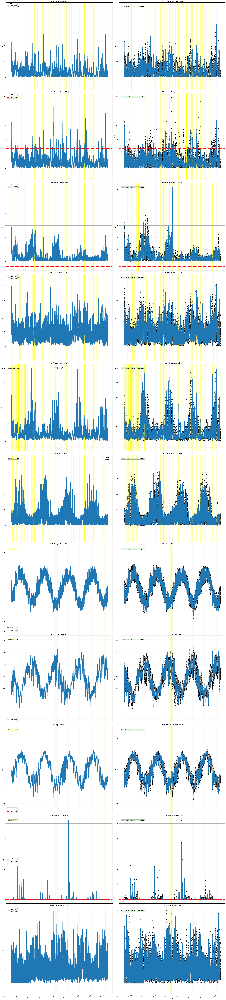

In [16]:
time_series_plot(df_analysis, method='spline')

In [17]:
df_analysis = fill_missing_value(df_analysis, method='spline')

#### **Handling Missing Categorical Data**

Dalam mengatasi missing value data kategorikal, saya memilih metode ffill dan bfill. Langkah ini saya ambil dengan asumsi bahwa arah angin pada jam-jam tertentu akan mirip. Jadi nilai akan yang hilang akan diisi dengan arah angin sebelum atau setelah titik missing value.

In [18]:
df_analysis['wd'] = df_analysis['wd'].fillna(method='ffill').fillna(method='bfill')

In [19]:
df_analysis.describe()

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000
mean,70.981210,94.785320,14.947876,44.203913,1156.988579,57.978303,13.671133,1007.771290,1.486361,0.060368,1.854761
std,72.400276,83.925986,21.009381,29.502812,1122.601553,54.259730,11.367244,10.226337,13.828929,0.752352,1.310165
min,2.000000,2.000000,0.285600,1.847700,99.980639,0.214200,-16.600000,982.400000,-35.100000,0.000000,0.000000
25%,18.000000,34.000000,2.000000,22.000000,500.000000,16.000000,3.400000,999.300000,-10.300000,0.000000,1.000000
50%,46.000000,72.000000,7.000000,36.000000,800.000000,46.000000,14.600000,1007.400000,1.700000,0.000000,1.500000
75%,100.000000,131.000000,18.000000,60.000000,1400.000000,80.000000,23.300000,1016.000000,14.200000,0.000000,2.300000
max,882.000000,999.000000,310.000000,226.000000,10000.000000,429.000000,41.400000,1036.500000,27.200000,52.100000,10.000000


#### **Handling Outliers**

Metode yang digunakan dalam menangani Outliers adalah Rolling window winsorization dimana akan membatasi nilai outliers dengan nilai kuantil yang dihitung secara bergeser setiap 30 titik data (window = 30).

In [20]:
def handling_outliers(df):
    columns = df.select_dtypes(include=['float64', 'int64']).columns

    for column in columns:
        Q05 = df[column].rolling(window=30, min_periods=1).quantile(0.05)
        Q95 = df[column].rolling(window=30, min_periods=1).quantile(0.95)

        df[column] = np.where(df[column] < Q05, Q05, df[column])
        df[column] = np.where(df[column] > Q95, Q95, df[column])

    return df

In [21]:
df_analysis = handling_outliers(df_analysis)

**Insight:**
- Frekuensi missing value pada setiap fitur berbeda-beda, ada fitur yang tersebar merata, tapi ada juga yang terpusat pada satu periode (1-2 bulan misalnya)
- Teknik interpolasi dengan metode spline terbukti mampu untuk membuat data yang hilang mengukiti pola data sehingga cukup mirip dengan nilai aslinya.


## **Exploratory Data Analysis (EDA)**

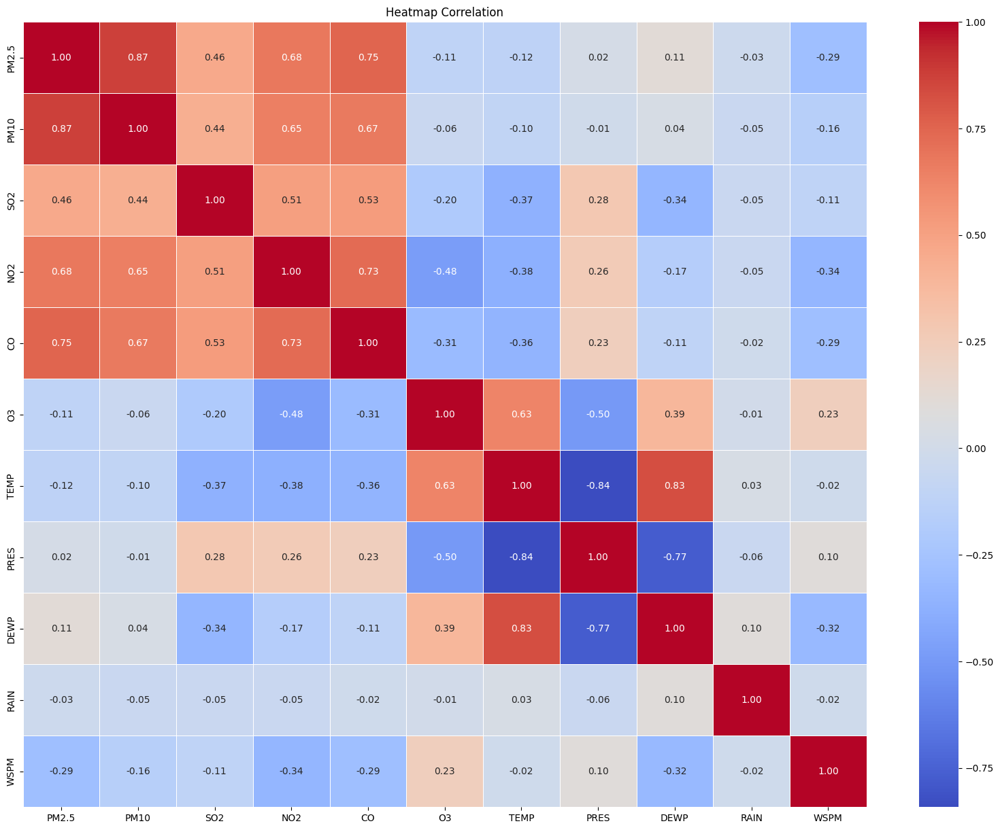

In [22]:
corr_matrix = df_analysis.corr(numeric_only=True)

plt.figure(figsize=(20, 15))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Heatmap Correlation")
plt.show()

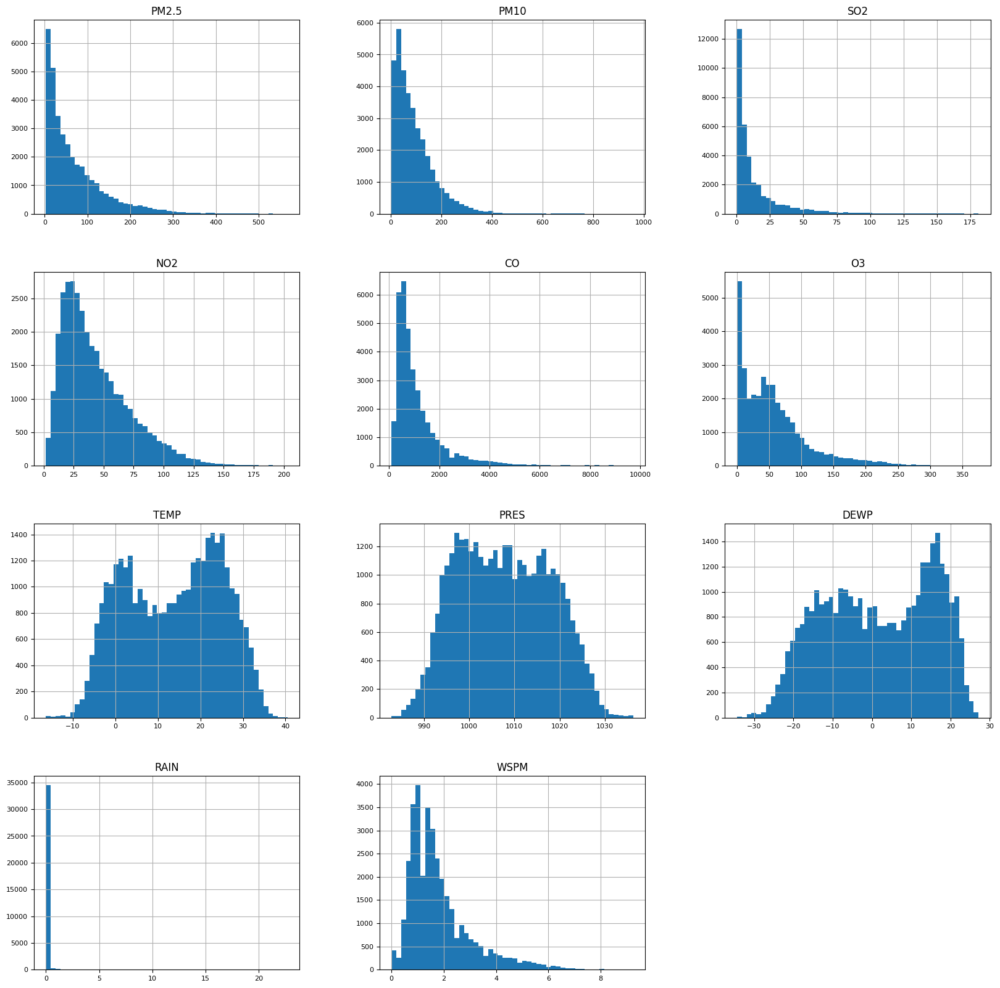

In [23]:
fig, axes = plt.subplots(figsize=(20, 20))
df_analysis.hist(bins=50, xlabelsize=8, ylabelsize=8, ax=axes)
plt.show()

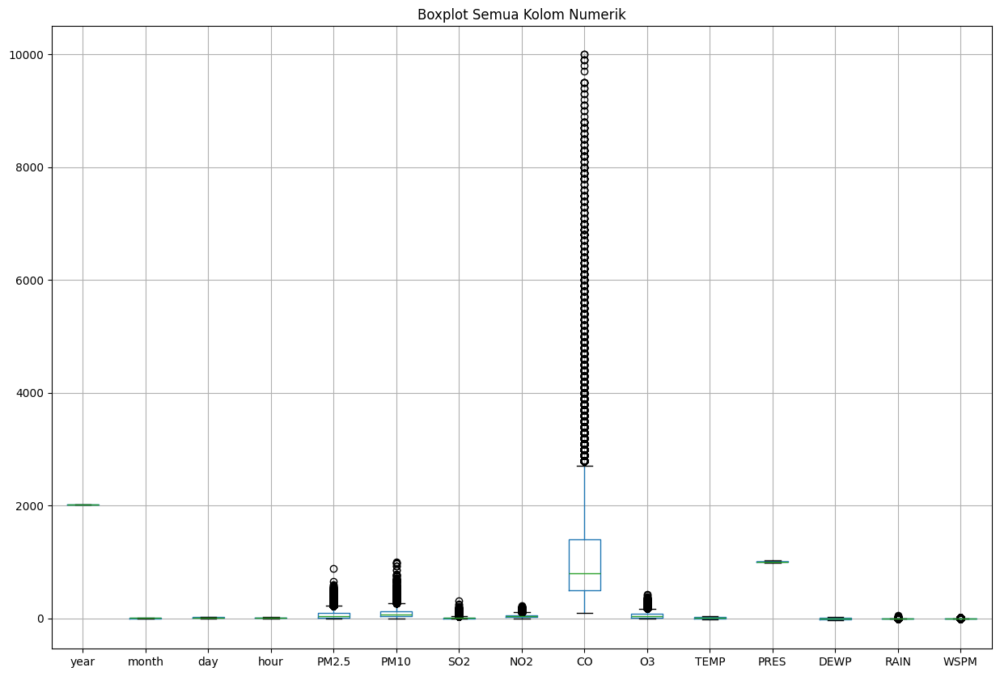

In [24]:
df.boxplot(figsize=(15, 10))
plt.title("Boxplot Semua Kolom Numerik")
plt.show()

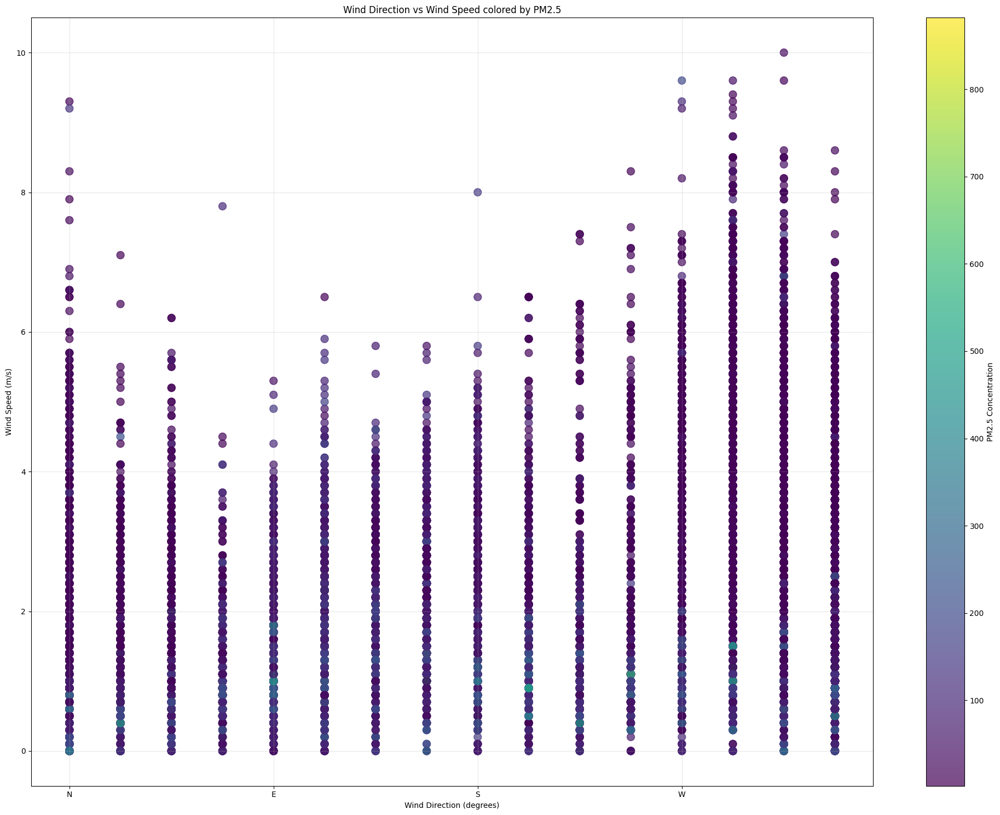

In [25]:
wind_dir_map = {
    'N': 0, 'NNE': 22.5, 'NE': 45, 'ENE': 67.5,
    'E': 90, 'ESE': 112.5, 'SE': 135, 'SSE': 157.5,
    'S': 180, 'SSW': 202.5, 'SW': 225, 'WSW': 247.5,
    'W': 270, 'WNW': 292.5, 'NW': 315, 'NNW': 337.5
}

df['wind_dir_angle'] = df['wd'].map(wind_dir_map)

plt.figure(figsize=(20, 15))
plt.scatter(df['wind_dir_angle'], df['WSPM'], c=df['PM2.5'], cmap='viridis', s=100, alpha=0.7)
plt.colorbar(label='PM2.5 Concentration')
plt.title('Wind Direction vs Wind Speed colored by PM2.5')
plt.xlabel('Wind Direction (degrees)')
plt.ylabel('Wind Speed (m/s)')
plt.xticks([0, 90, 180, 270], ['N', 'E', 'S', 'W'])
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

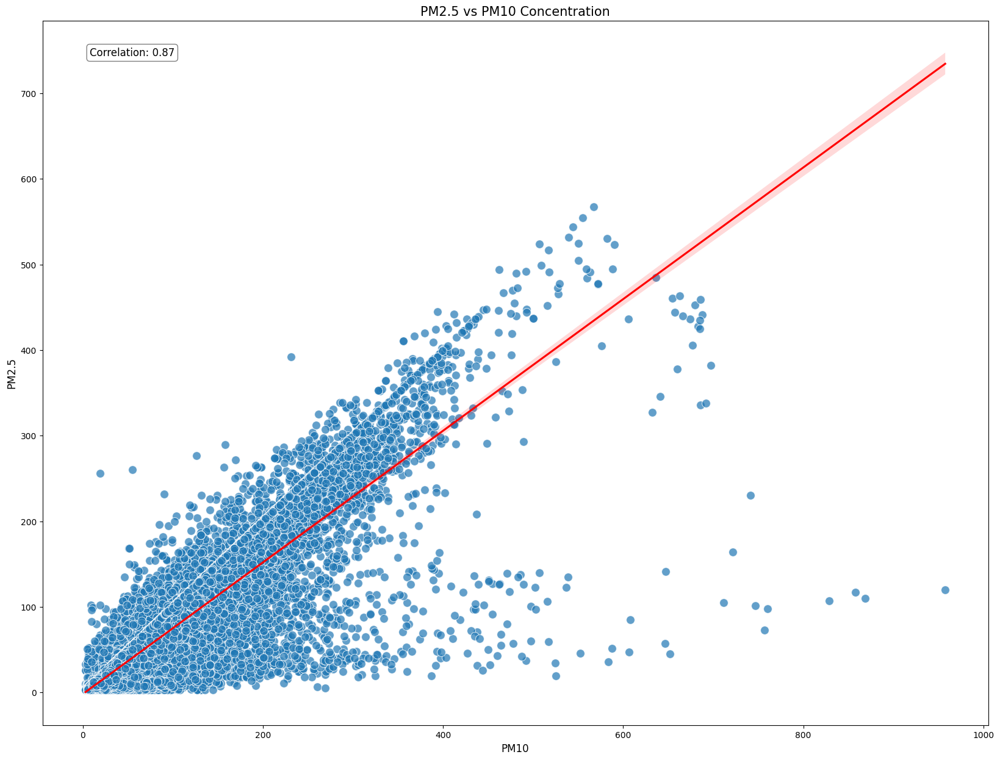

In [26]:
plt.figure(figsize=(20, 15))
sns.scatterplot(x='PM10', y='PM2.5', data=df_analysis, s=100, alpha=0.7)
plt.title('PM2.5 vs PM10 Concentration', fontsize=15)
plt.xlabel('PM10 (μg/m³)', fontsize=12)
plt.ylabel('PM2.5 (μg/m³)', fontsize=12)

sns.regplot(x='PM10', y='PM2.5', data=df_analysis, scatter=False, color='red')

correlation = df_analysis['PM2.5'].corr(df_analysis['PM10'])
plt.annotate(f'Correlation: {correlation:.2f}',
             xy=(0.05, 0.95), xycoords='axes fraction',
             fontsize=12, bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray"))
plt.show()

**Insight:**
- Setiap zat-zat polutan seperti PM2.5, PM10, CO, NO2, dan SO2 berkorelasi positif. Artinya, ketika misalnya PM2.5 meningkat, tiga zat lainnya juga meningkat.
- Dari heatmap korelasi juga dapat diketahui bahwa zat-zat polutan memiliki korelasi negatif dengan aspek-aspek cuaca seperti temperatur, intensitas hujan, dan kecepatan angin.
- Zat-zat polutan PM2.5, PM10, SO2, NO2, CO memiliki right skewed (heavy right tail). Jadi, bisa diasumsikan bahwa rata-rata titik data zat-zat polutan masih cukup rendah.
- Rata-rata kecepatan angin untuk setiap arah angin berada di rentang 0-6 m/s.
- PM2.5 jika dilihat dari warnanya, kebanyakan masih berada di range kurang dari 200 mikrogram/m3.
- Polutan PM2.5 dan PM10 memiliki hubungan linear yang sangat kuat. Data terdistribusi di sekitar garis regresi, namun ada beberapa titik yang berada agak jauh dari garis.


## **Visualization & Explanatory Analysis**

### **Pertanyaan 1**

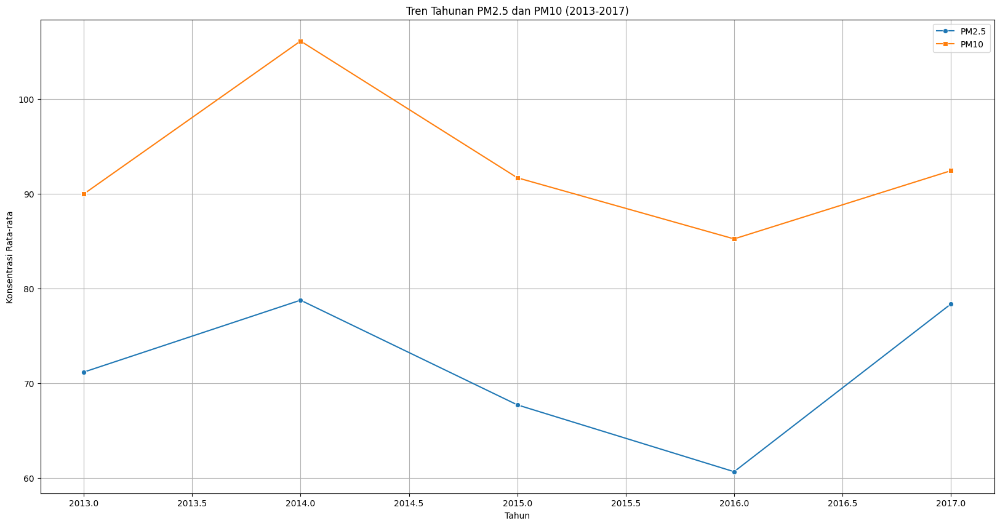

In [27]:
annual_pm25 = df_analysis.resample('Y')['PM2.5'].mean()
annual_pm10 = df_analysis.resample('Y')['PM10'].mean()

plt.figure(figsize=(20, 10))
sns.lineplot(x=annual_pm25.index.year, y=annual_pm25.values, marker='o', label='PM2.5')
sns.lineplot(x=annual_pm10.index.year, y=annual_pm10.values, marker='s', label='PM10')
plt.title('Tren Tahunan PM2.5 dan PM10 (2013-2017)')
plt.xlabel('Tahun')
plt.ylabel('Konsentrasi Rata-rata')
plt.legend()
plt.grid(True)
plt.show()

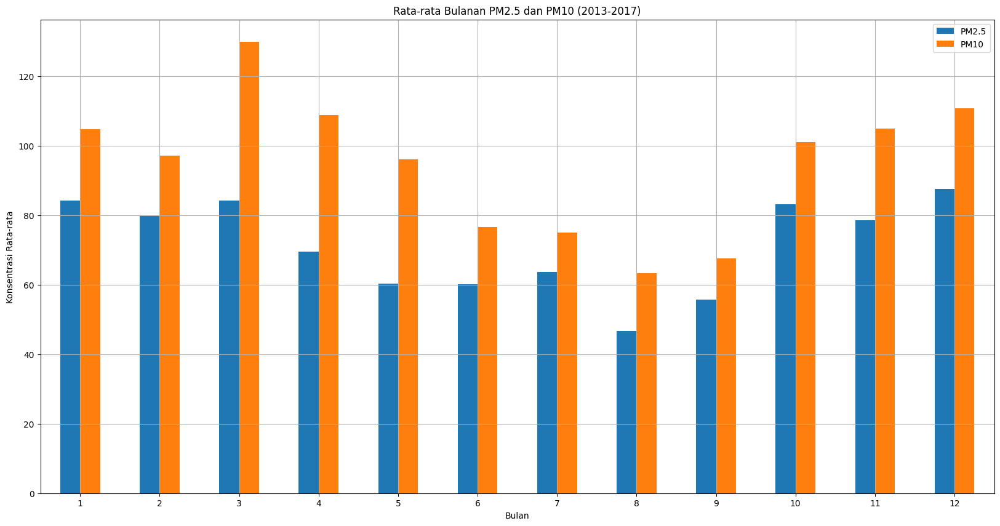

In [28]:
df['month'] = df_analysis.index.month

monthly_mean = df.groupby('month')[['PM2.5','PM10']].mean()

plt.figure(figsize=(20, 10))
monthly_mean.plot(kind='bar', ax=plt.gca())
plt.title('Rata-rata Bulanan PM2.5 dan PM10 (2013-2017)')
plt.xlabel('Bulan')
plt.ylabel('Konsentrasi Rata-rata')
plt.xticks(rotation=0)
plt.grid(True)
plt.show()


### **Pertanyaan 2:**

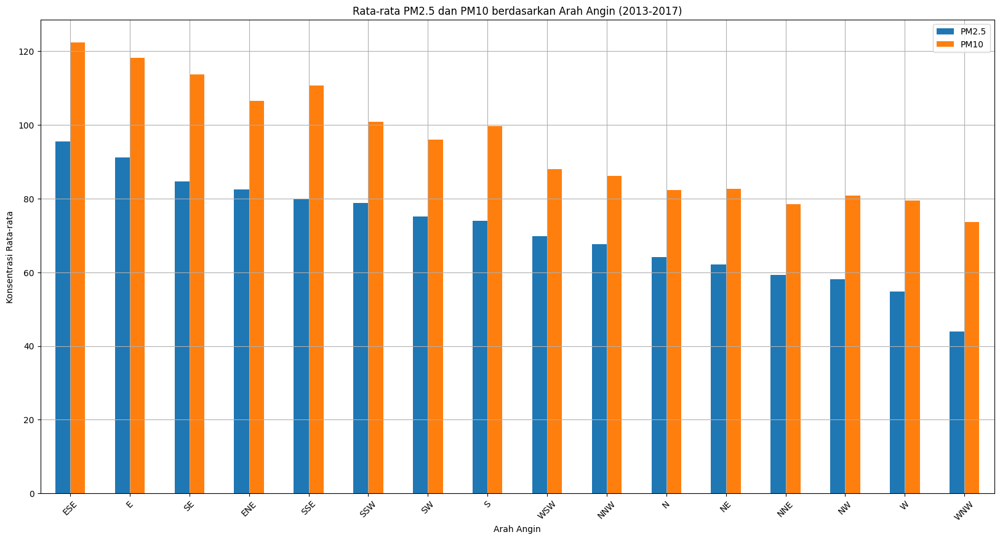

In [29]:
wind_pm = df_analysis.groupby('wd')[['PM2.5','PM10']].mean()

wind_pm.sort_values('PM2.5', ascending=False, inplace=True)

plt.figure(figsize=(20, 10))
wind_pm.plot(kind='bar', ax=plt.gca())
plt.title('Rata-rata PM2.5 dan PM10 berdasarkan Arah Angin (2013-2017)')
plt.xlabel('Arah Angin')
plt.ylabel('Konsentrasi Rata-rata')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


In [30]:
def highlight_SSE(ax, df):
    ese_indices = np.where(df['wd'] == 'ESE')[0]

    if len(ese_indices) == 0:
        return

    groups = []
    current_group = [ese_indices[0]]

    for i in range(1, len(ese_indices)):
        if ese_indices[i] == ese_indices[i-1] + 1:
            current_group.append(ese_indices[i])
        else:
            groups.append(current_group)
            current_group = [ese_indices[i]]

    if current_group:
        groups.append(current_group)

    for group in groups:
        start_idx = group[0]
        end_idx = group[-1]

        if isinstance(df.index, pd.DatetimeIndex):
            start = df.index[start_idx]
            if end_idx + 1 < len(df.index):
                end = df.index[end_idx + 1]
            else:
                end = df.index[end_idx]
        else:
            start = start_idx
            end = end_idx + 1

        ax.axvspan(start, end, alpha=0.3, color='red')

In [31]:
def ese_position_plot(df):
    columns = ['TEMP', 'PRES', 'DEWP', 'RAIN']
    n_columns = len(columns)
    n_rows = n_columns
    fig, axes = plt.subplots(n_rows, 1, figsize=(30, 12 * n_rows))

    if n_columns == 1:
        axes = [axes]

    for i, column in enumerate(columns):
        ax = axes[i]
        sns.lineplot(data=df, x=df.index, y=column, ax=ax)
        ax.set_title(f'{column}')
        ax.grid(True)
        if isinstance(df.index, pd.DatetimeIndex):
            fig.autofmt_xdate()

        highlight_SSE(ax, df)

    plt.tight_layout()
    plt.show()

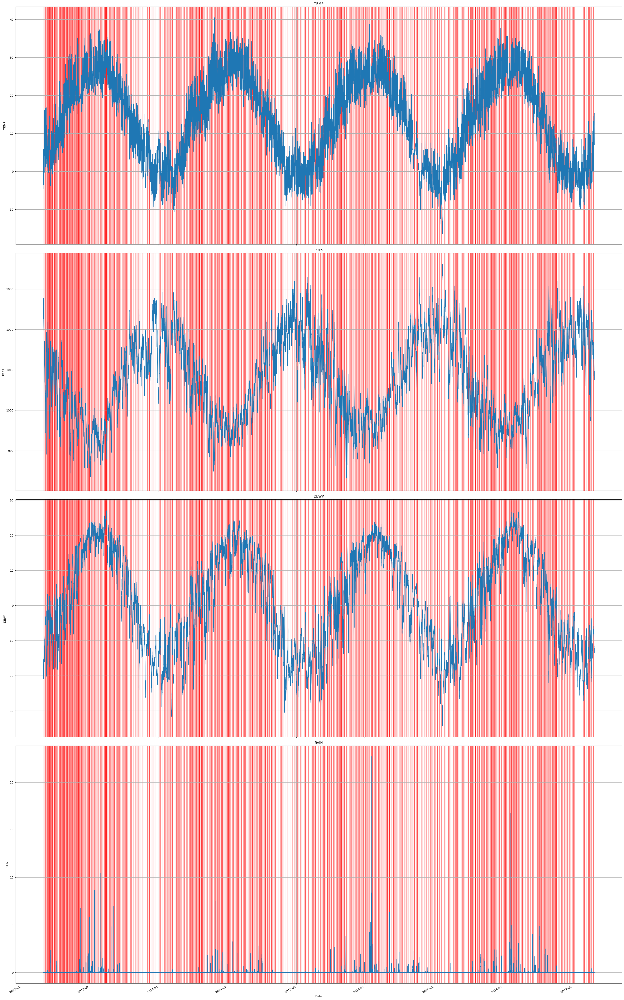

In [32]:
ese_position_plot(df_analysis)

### **Pertanyaan 3**

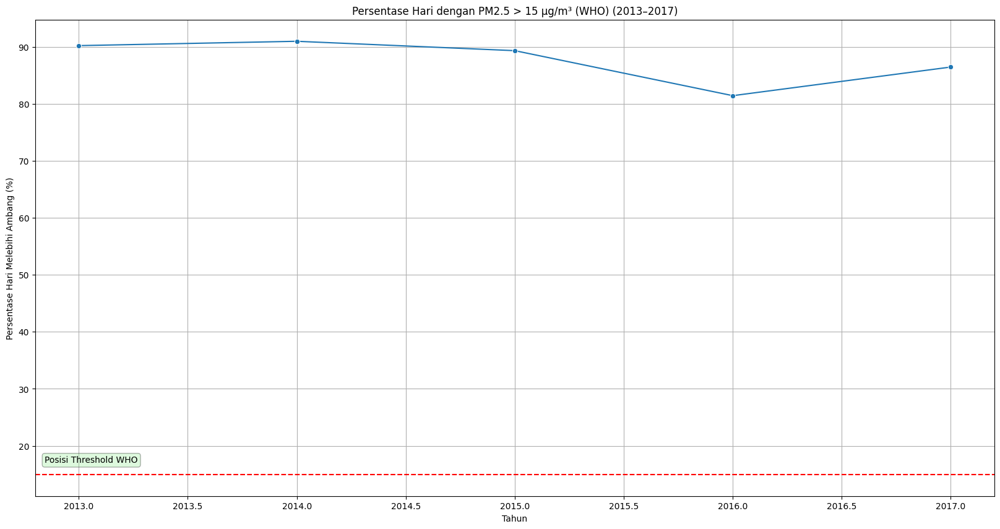

In [33]:
WHO_THRESHOLD = 15
df_daily = df_analysis.select_dtypes(exclude='object').resample('D').mean()
df_daily['exceed'] = df_daily['PM2.5'] > WHO_THRESHOLD
df_daily['year'] = df_daily.index.year
annual_exceed_percent = df_daily.groupby('year')['exceed'].mean() * 100


plt.figure(figsize=(20, 10))
plt.annotate("Posisi Threshold WHO", xy=(0.01, 0.07), xycoords='axes fraction',
                   bbox=dict(boxstyle="round,pad=0.3", fc="lightgreen", alpha=0.3))
plt.axhline(y=WHO_THRESHOLD, color='r', linestyle='--')
sns.lineplot(x=annual_exceed_percent.index, y=annual_exceed_percent.values, marker='o')
plt.title('Persentase Hari dengan PM2.5 > 15 µg/m³ (WHO) (2013–2017)')
plt.xlabel('Tahun')
plt.ylabel('Persentase Hari Melebihi Ambang (%)')
plt.grid(True)
plt.show()

**Insight:**

**Pertanyaan 1**
- Rata-rata PM2.5 dan PM10 pada bulan Agustus merupakan titik terendah dalam setahun. Nilai PM2.5 tertinggi berada di bulan Desember dan PM10 berada pada bulan Maret.
- Berdasarkan tren tahunan, PM2.5 dan PM10 terus mengalami penurunan setelah mencapai puncak pada awal tahun 2014 hingga awal tahun 2016. Namun setelah itu, keduanya kembali meningkat. Insight semakin membuktikan korelasi positif antara kedua polutan ini.
- Berdasarkan beberapa artikel yang saya baca, ditemukan bahwa dalam periode 2013-2017 sedang dilaksanakan program Beijing 2013-2017 Clean Air Action Plan. Sehingga bisa saja penurunan pada tahun 2016 yang terjadi merupakan hasil dari kebijakan ini.

**Pertanyaan 2**
- Berdasarkan barplot yang telah dirancang, ditemukan bahwa arah angin ESE (East-Southeast) - 112.5° menunjukkan konsentrasi partikel PM2.5 dan PM10 yang relatif paling tinggi.
- Di sisi lain, arah angin seperti NNW (North-Northwest), NW (Northwest), dan N (North) cenderung memiliki konsentrasi partikulat terendah.
- Jika dilihat arah angin dengan partikel polusi tertinggi dan terendah, terdapat gap yang cukup jauh.
- Pada posisi ESE dari distrik Changping, terdapat bagian distrik lain dari Kota Beijing yang merupakan ibukota Negara Tiongkok (pusat urbanisasi dan industri). Disinyalir karena status tersebut, daerah itu merupakan penghasil polusi yang cukup tinggi sehingga angin membawa partikel PM2.5 dan PM10 ke arah Changping
- Analisis kemudian dilanjutkan untuk melihat frekuensi arah angin ESE dalam rentang 2013–2017. Ditemukan bahwa arah angin ESE cukup sering terjadi, dengan beberapa periode di mana frekuensinya meningkat secara signifikan. Frekuensi arah angin ESE akan meningkat ketika Curah hujan tinggi, Temperatur tinggi, Titik embun tinggi, dan Tekanan udara rendah.

**Pertanyaan 3**
- Terlihat bahwa pada setiap tahunnya, semuanya terpantau memiliki konsentrasi PM2.5 di atas 15 mikrogram/m3. Ini menandakan kualitas udara di distrik Changping secara umum tidak memenuhi standar harian WHO dalam mayoritas hari setiap tahunnya.
- Bukan hanya diatas standar minimum, tapi jaraknya dengan ambang batas sangat jauh dengan tingkat rata-rata polusi adalah 90-95%.
- Seperti yang telah dibahas pada pertanyaan satu, penurunan memang terjadi pada tahun 2016, tapi belum mencapai standar yang ditetapkan oleh WHO
- Tingginya persentase hari melebihi standar WHO menjadi peringatan bahwa kualitas udara di wilayah ini perlu ditangani secara serius.

## **Analisis Lanjutan (Opsional)**

### **Simple Clustering**
Dalam rangka melakukan klaster data, fokus data yang akan digunakan adalah PM2.5. Terdapat beberapa artikel dan juga tools penting yang menjadi acuan, yaitu:

- [Kalkulator/Tabel konversi dari PM2.5 ke AQI](https://www.airnow.gov/aqi/aqi-calculator-concentration/)
- [AQI Index](https://aqicn.org/scale/)

In [94]:
df_analysis_lanjutan = df_analysis.copy(deep=True)

In [101]:
# Rumus dan beberapa nilai tidak ditemukan pada halaman web tersebut, tapi ada pada kode javascript web.
def linear(AQIhigh, AQIlow, Conchigh, Conclow, concentration):
    conc = float(concentration)
    a = ((conc - Conclow) / (Conchigh - Conclow)) * (AQIhigh - AQIlow) + AQIlow
    return round(a)

def aqi_pm25(concentration):
    c = math.floor(10 * float(concentration)) / 10.0
    if 0.0 <= c <= 9.0:
        return linear(50, 0, 9.0, 0.0, c)
    elif 9.1 <= c <= 35.4:
        return linear(100, 51, 35.4, 9.1, c)
    elif 35.5 <= c <= 55.4:
        return linear(150, 101, 55.4, 35.5, c)
    elif 55.5 <= c <= 125.4:
        return linear(200, 151, 125.4, 55.4, c)
    elif 125.5 <= c <= 225.4:
        return linear(300, 201, 225.4, 125.5, c)
    elif c >= 225.5:
        return linear(500, 301, 325.4, 225.5, c)
    else:
        return "Out of Range"

In [96]:
def aqi_cat(aqi):
    """
    Skor didasarkan pada tabel yang ada di web https://aqicn.org/scale/

    Skor M (Magnitude) berdasarkan nilai AQI:
      AQI <= 50   => skor 1 (Good)
      AQI <= 100  => skor 2 (Moderate)
      AQI <= 150  => skor 3 (Unhealthy for Sensitive Groups)
      AQI <= 200  => skor 4 (Unhealthy)
      AQI <= 300  => skor 5 (Very Unhealthy)
      AQI > 300   => skor 6 (Hazardous)
    """
    if aqi <= 50:
        return "Good"
    elif aqi <= 100:
        return "Moderate"
    elif aqi <= 150:
        return "Unhealthy for SG"
    elif aqi <= 200:
        return "Unhealthy"
    elif aqi <= 300:
        return "Very Unhealthy"
    else:
        return "Hazardous"

In [97]:
def health_risk_category(pm25):
    if pm25 <= 5:
        return "Minimal Risk"
    elif pm25 <= 10:
        return "Low Risk"
    elif pm25 <= 20:
        return "Medium Risk"
    elif pm25 <= 35:
        return "High Risk"
    else:
        return "Very High Risk"

In [98]:
df_analysis_lanjutan['AQI_PM25'] = df_analysis_lanjutan['PM2.5'].apply(aqi_pm25)
df_analysis_lanjutan['AQI_Category'] = df_analysis_lanjutan['AQI_PM25'].apply(aqi_cat)

pm25_min = df_analysis_lanjutan['PM2.5'].min()
pm25_max = df_analysis_lanjutan['PM2.5'].max()
bin_width = (pm25_max - pm25_min) / 5

bins = [pm25_min + i * bin_width for i in range(6)]
labels = [f'Bin {i+1}' for i in range(5)]
df_analysis_lanjutan['PM25_EqualWidth_Bin'] = pd.cut(df_analysis_lanjutan['PM2.5'], bins=bins, labels=labels, include_lowest=True)

df_analysis_lanjutan['PM25_EqualFreq_Bin'] = pd.qcut(df_analysis_lanjutan['PM2.5'], q=5, labels=[f'Quantile {i+1}' for i in range(5)], duplicates='drop')

df_analysis_lanjutan['Health_Risk'] = df_analysis_lanjutan['PM2.5'].apply(health_risk_category)

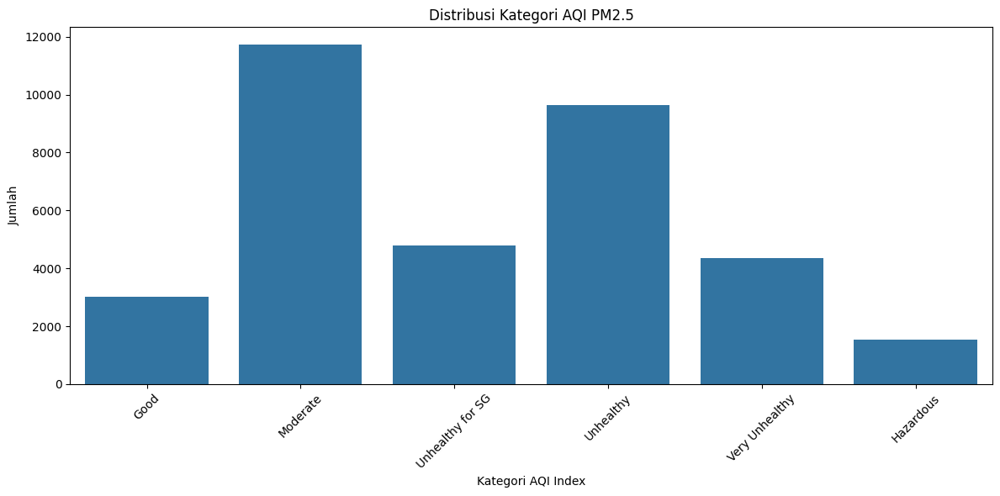

In [99]:
plt.figure(figsize=(12, 6))
sns.countplot(x='AQI_Category', data=df_analysis_lanjutan)
plt.title('Distribusi Kategori AQI PM2.5')
plt.xlabel('Kategori AQI Index')
plt.ylabel('Jumlah')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

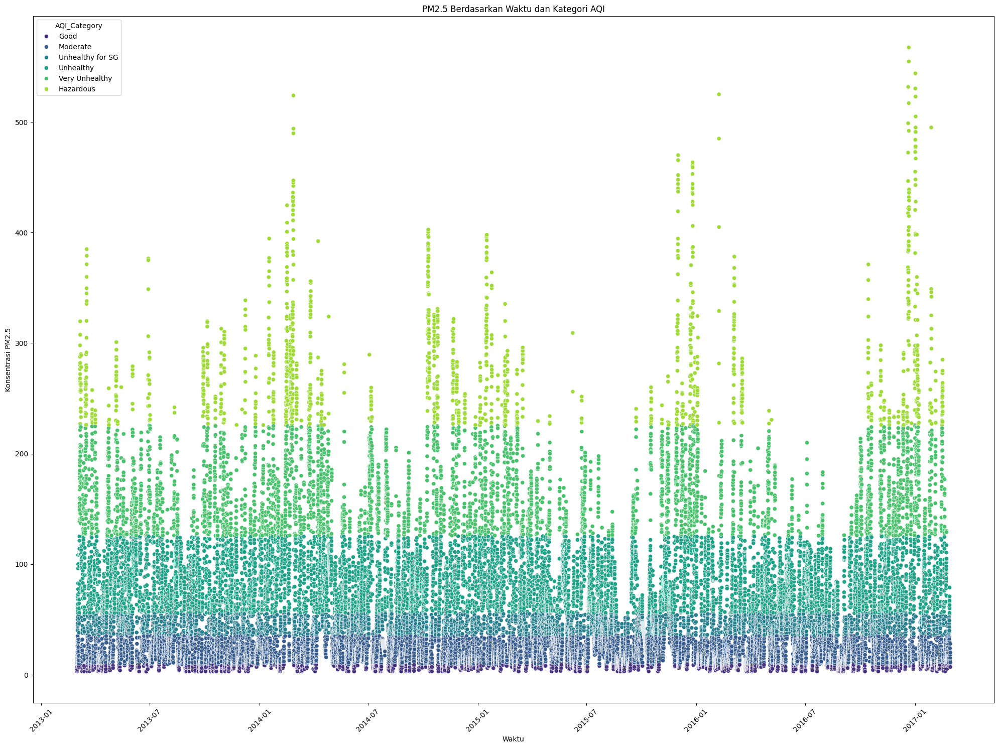

In [100]:
plt.figure(figsize=(20, 15))
sns.scatterplot(x=df_analysis_lanjutan.index, y='PM2.5', hue='AQI_Category', data=df_analysis_lanjutan, palette='viridis')
plt.title('PM2.5 Berdasarkan Waktu dan Kategori AQI')
plt.xlabel('Waktu')
plt.ylabel('Konsentrasi PM2.5')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Insight:**

- Kategori moderate memiliki jumlah yang paling tinggi, tapi pada periode yang sama, kategori unhealty juga cukup sering terjadi di distrik Changping
- Fluktuasi kualitas udara yang cukup dinamis dalam rentang waktu 2013-2017 dimana terdapat periode dimana PM2.5 hanya mencapai titik Unhealty-Very Unhealty dan ada juga periode PM2.5 mencapai Hazardous. Keadaan ini jelas terlihat membentuk pola musiman.
- Data PM2.5 masih cukup banyak yang tersebar pada kategori Good-Moderate. Tapi, kategori moderate lebih dominan yang dimana titik itu berada diatas batas batas normal WHO.



## **Conclusion**

- Kualitas udara cenderung berubah-ubah dan belum stabil pada tingkat yang benar-benar aman, dengan kategori "Moderat" yang paling umum. Pola musiman dengan puncak polusi ditandai dengan PM2.5 mencapai titik Hazardous juga terlihat selama periode tertentu.

- Jumlah PM2.5 sering melebihi standar WHO. Sebagian besar titik data, terutama selama musim dingin (Desember) dan awal tahun, nilai PM2.5 masih di atas standar WHO. Levelnya belum mencapai standar aman, meskipun sempat turun pada tahun 2016.

- Ketika angin ESE (East-Southeast) sering terjadi, diasumsikan bahwa partikel polusi dibawa ke Distrik Changping dari kawasan industri dan kota di bagian lain Beijing.

- Terjadi kondisi korelasi positif antar polutan (kecuali co3) dan korelasi negatif antara polutan dan kondisi cuaca. Jika polutan tertentu meningkat (seperti PM2.5), polutan lain (PM10, CO, NO2, dan SO2) cenderung meningkat juga. Di sisi lain, faktor cuaca seperti hujan dan kecepatan angin membantu mengurangi konsentrasi polutan.

- Secara keseluruhan, kualitas udara masih membutuhkan penanganan yang serius. Persentase hari dengan PM2.5 di atas 15 mikrogram/m3 meningkat 90–95% setiap tahun, menunjukkan bahwa upaya untuk memperbaiki kualitas udara harus terus ditingkatkan untuk memenuhi standar WHO.